# 02. Split Data with Probabilities

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import plotly.express as px

In [2]:
rnd_nbr = 42
train_frac = 0.95

## Read data

In [3]:
db = pd.read_excel("../data/raw/archivo_combinado.xlsx")

In [4]:
# Eliminar los que no cumplan con la aritmética
db = db[db.k0 + db.k1 + db.k2 == db.Marcadores]

In [5]:
db_prob = db[["k1", "k2", "True_positive"]].copy()
db_prob["True_positive"] = np.where(db_prob["True_positive"] == False, 0, 1)

In [6]:
db_prob = db_prob.groupby(["k1", "k2"]).mean().reset_index()

<AxesSubplot: >

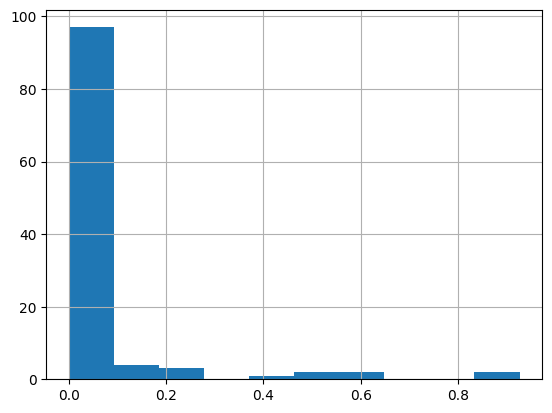

In [7]:
db_prob["True_positive"].hist()

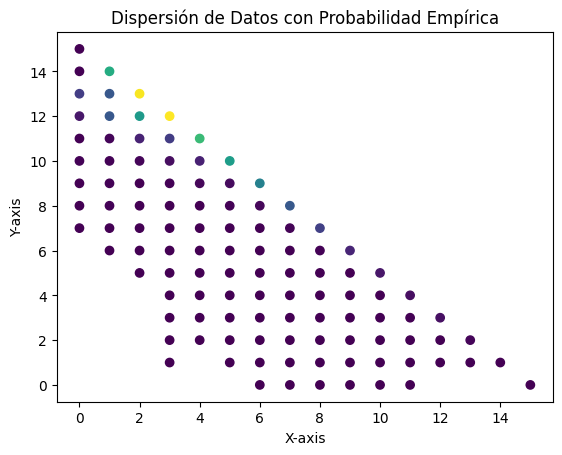

In [8]:
plt.scatter(db_prob["k1"],
            db_prob["k2"],
            c = db_prob["True_positive"]) # Assign colors based on the list
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Dispersión de Datos con Probabilidad Empírica")
plt.show()

In [9]:
fig = px.scatter_3d(db_prob, x='k1', y='k2', z='True_positive',
              color='True_positive')
fig.show()

## Join both Dataframes

In [10]:
db_prob.rename(columns={'True_positive': 'prob'}, inplace=True)
db = db.merge(db_prob, on = ['k1', 'k2'])

In [11]:
db['ValueLog10'] = np.log10(db['Value'])

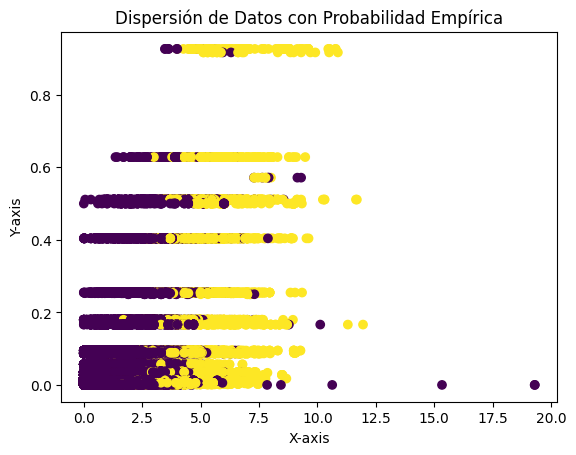

In [12]:
plt.scatter(db["ValueLog10"],
            db["prob"],
            c = db["True_positive"]) # Assign colors based on the list
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.title("Dispersión de Datos con Probabilidad Empírica")
plt.show()

In [14]:
fig = px.scatter_3d(db.sample(frac = 0.25), x='ValueLog10', y='prob', z='True_positive',
              color='True_positive')
fig.show()